In [1]:
#Import Libraries/Packages
import numpy as np
import cv2
import os
import random
from skimage.io import imread
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Conv2D,MaxPooling2D,Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from IPython.display import Audio

### Reading the train and test data

In [2]:
train_dir = r'C:\Users\Lenovo\Downloads\archive\train'
test_dir = r'C:\Users\Lenovo\Downloads\archive\test'

row, col = 48, 48
classes = 7

def count_exp(path, set_):
    dict_ = {}
    for expression in os.listdir(path):
        dir_ = path +"/" +expression
        dict_[expression] = len(os.listdir(dir_))
    df = pd.DataFrame(dict_, index=[set_])
    return df
train_count = count_exp(train_dir, 'train')
test_count = count_exp(test_dir, 'test')
print(train_count)
print(test_count)

       angry  disgust  fear  happy  neutral   sad  surprise
train   3995      436  4097   7215     4965  4830      3171
      angry  disgust  fear  happy  neutral   sad  surprise
test    958      111  1024   1774     1233  1247       831


### Data Visualization

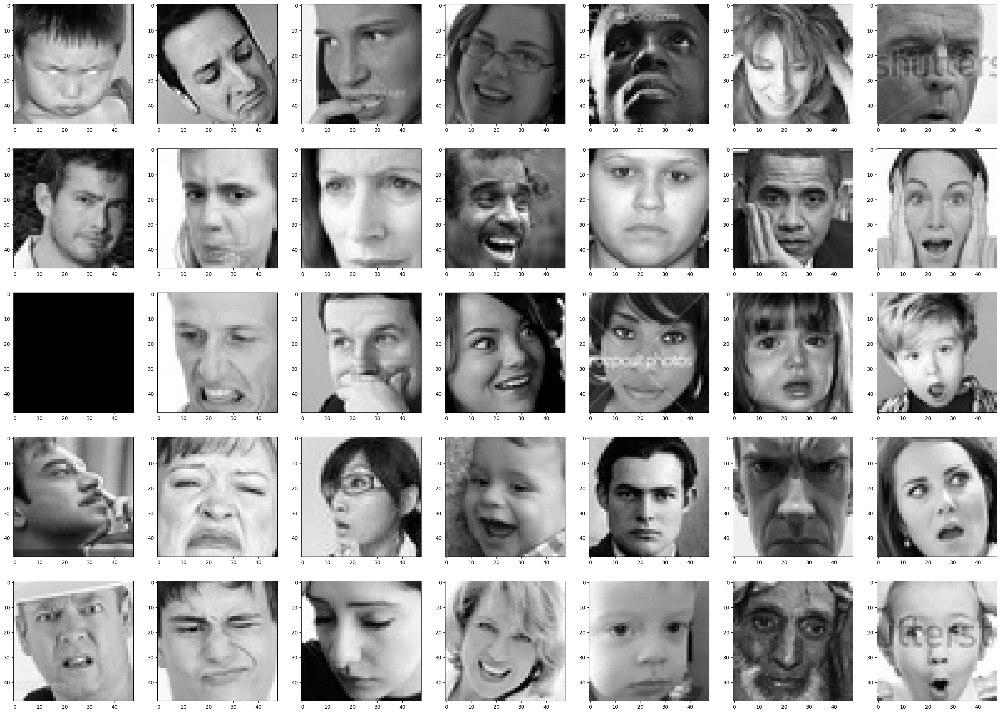

In [3]:
# Data Visualization
from skimage.io import imread
train_dir = "C:\\Users\\Lenovo\\Downloads\\archive\\train\\"
test_dir = "C:\\Users\\Lenovo\\Downloads\\archive\\test\\"
total_labels = len(os.listdir(train_dir))

fig, ax = plt.subplots(nrows=5, ncols=total_labels, figsize=(35, 25))
for x in range(5):
    for y,v in zip(range(total_labels),os.listdir(train_dir)):
        ax[x][y].imshow(imread(train_dir+v+'/'+os.listdir(train_dir+v)[x]), cmap='gray')

plt.show()

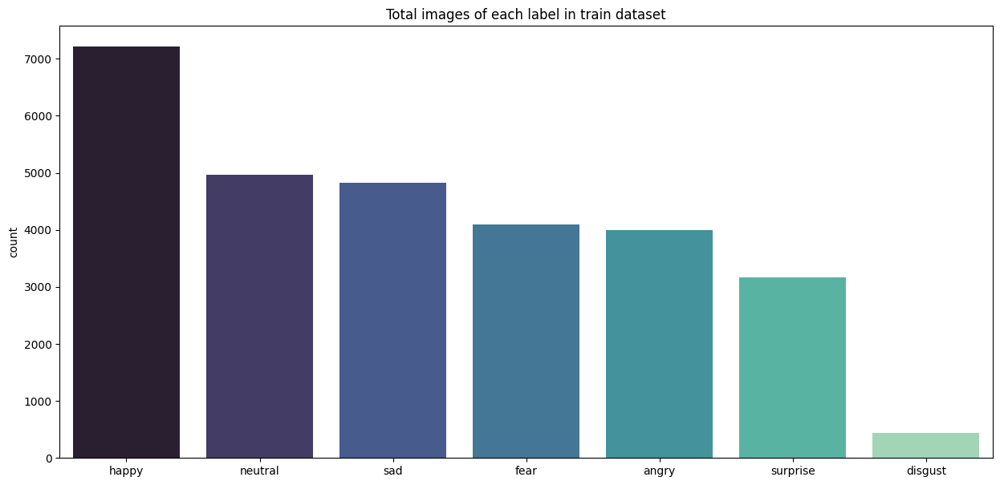

In [4]:
df = {}
for i in os.listdir(train_dir):
    directory = train_dir + i
    df[i] = len(os.listdir(directory))
df = pd.DataFrame(df, index=["total"]).transpose().sort_values("total", ascending=False)

plt.figure(figsize=(15,7))
sns.barplot(x=df.index, y="total", palette="mako", data=df)
plt.ylabel("count")
plt.title("Total images of each label in train dataset")
plt.show()

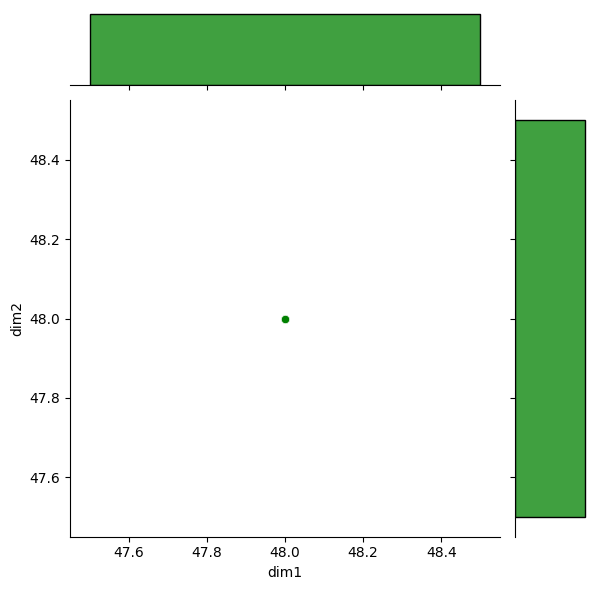

In [5]:
happy = os.listdir(train_dir+'happy/')
dim1, dim2 = [], []

for img_filename in happy:
    img = imread(train_dir+'happy/'+img_filename)
    d1, d2 = img.shape
    dim1.append(d1)
    dim2.append(d2)

df = pd.DataFrame({'dim1': dim1, 'dim2': dim2})
sns.jointplot(data=df, x='dim1', y='dim2', color='g')
plt.show()
img_shape = (int(np.mean(dim1)), int(np.mean(dim2)), 1)

### Data Preprocessing

In [6]:
# Data Preprocessing
train_gen = ImageDataGenerator(rescale=1/255,
                                rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                shear_range=0.2,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                fill_mode='nearest')

test_gen = ImageDataGenerator(rescale=1/255)



train_generator = train_gen.flow_from_directory(directory=train_dir,
                                                target_size=(img_shape[0], img_shape[1]),
                                                color_mode='grayscale',
                                                batch_size=64,
                                                class_mode='categorical',
                                                shuffle=True)

test_generator = test_gen.flow_from_directory(directory=test_dir,
                                                target_size=(img_shape[0], img_shape[1]),
                                                color_mode='grayscale',
                                                batch_size=64,
                                                class_mode='categorical',
                                                shuffle=False)

Found 28709 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


### Create the Model

In [7]:
# Create the Model
model = Sequential()

model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu', input_shape=img_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(units=len(os.listdir(train_dir)), activation='softmax'))

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 64)        640       
                                                                 
 batch_normalization (BatchN  (None, 48, 48, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 64)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 24, 24, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 128)       73856     
                                                                 
 batch_normalization_1 (Batc  (None, 24, 24, 128)      5

### Training the model

In [8]:
# Train the model
model.compile(optimizer=Adam(learning_rate=0.0001, 
                             decay=1e-6), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [9]:
steps_per_epoch = train_generator.n // train_generator.batch_size
validation_steps = test_generator.n // test_generator.batch_size
num_epochs = 20

history = model.fit(train_generator,
                    epochs=num_epochs,
                    verbose=1,
                    #callbacks=callbacks,
                    validation_data=test_generator,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=validation_steps)

Epoch 1/20
448/448 [==============================] - 672s 1s/step - loss: 1.8753 - accuracy: 0.2296 - val_loss: 2.1711 - val_accuracy: 0.2446
Epoch 2/20
448/448 [==============================] - 579s 1s/step - loss: 1.8046 - accuracy: 0.2437 - val_loss: 1.8094 - val_accuracy: 0.2561
Epoch 3/20
448/448 [==============================] - 417s 931ms/step - loss: 1.7898 - accuracy: 0.2523 - val_loss: 1.7374 - val_accuracy: 0.2793
Epoch 4/20
448/448 [==============================] - 421s 940ms/step - loss: 1.7741 - accuracy: 0.2638 - val_loss: 1.7175 - val_accuracy: 0.3079
Epoch 5/20
448/448 [==============================] - 344s 768ms/step - loss: 1.7612 - accuracy: 0.2703 - val_loss: 1.7108 - val_accuracy: 0.3128
Epoch 6/20
448/448 [==============================] - 330s 736ms/step - loss: 1.7375 - accuracy: 0.2899 - val_loss: 1.6060 - val_accuracy: 0.3552
Epoch 7/20
448/448 [==============================] - 342s 763ms/step - loss: 1.7121 - accuracy: 0.3013 - val_loss: 1.5808 - val_a

In [10]:
model.save("model.h5")

### Evaluating the model

In [11]:
# Evaluate the model
test_loss, test_acc = model.evaluate(test_generator)
print("validation accuracy :", str(test_acc*100)+"%")
print("validation loss :", test_loss)

113/113 [==============================] - 28s 249ms/step - loss: 1.1740 - accuracy: 0.5428
validation accuracy : 54.276955127716064%
validation loss : 1.1739511489868164


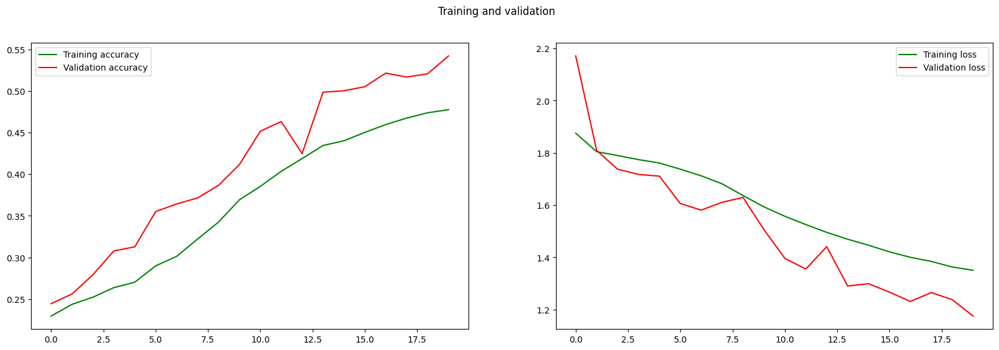

In [12]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
ax[0].plot(epochs, acc, 'g', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'r', label='Validation accuracy')
ax[0].legend(loc=0)
ax[1].plot(epochs, loss, 'g', label='Training loss')
ax[1].plot(epochs, val_loss, 'r', label='Validation loss')
ax[1].legend(loc=0)

plt.suptitle('Training and validation')
plt.show()

113/113 [==============================] - 53s 460ms/step


C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

       angry       0.46      0.34      0.39       958
     disgust       0.00      0.00      0.00       111
        fear       0.37      0.20      0.26      1024
       happy       0.72      0.86      0.78      1774
     neutral       0.46      0.61      0.52      1233
         sad       0.40      0.45      0.42      1247
    surprise       0.68      0.65      0.66       831

    accuracy                           0.54      7178
   macro avg       0.44      0.44      0.43      7178
weighted avg       0.52      0.54      0.52      7178





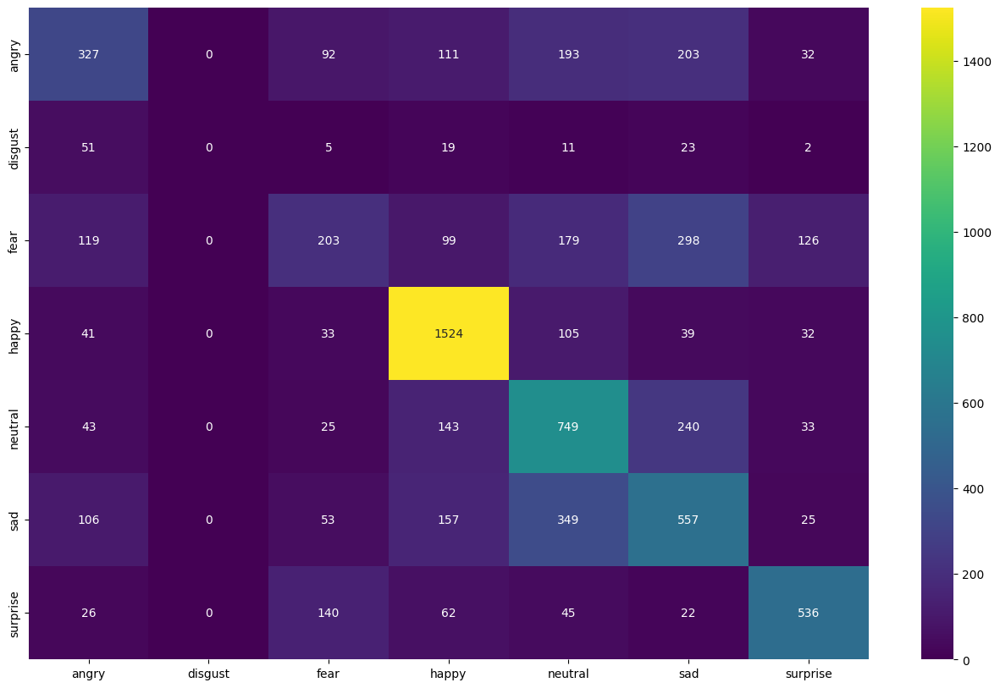

In [13]:
# confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

y_pred = np.argmax(model.predict(test_generator), axis=-1)
print(classification_report(test_generator.classes, y_pred, target_names=test_generator.class_indices.keys()), end='\n\n\n')

cm = confusion_matrix(test_generator.classes, y_pred)
plt.figure(figsize=(16,10))
sns.heatmap(cm, cmap=plt.cm.viridis, annot=True, fmt='.0f', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.show()

### Testing our model with new image

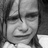

In [14]:
# Testing our model with new image
image = cv2.imread("C:\\Users\\Lenovo\\Downloads\\archive\\test\\fear\\PublicTest_98773801.jpg")
from IPython.display import Image
Image(filename="C:\\Users\\Lenovo\\Downloads\\archive\\test\\fear\\PublicTest_98773801.jpg")

In [15]:
import cv2
from tensorflow.python.keras.models import load_model
import os

# Load the trained model
model = tf.keras.models.load_model("model.h5",
                                   custom_objects={'Functional': tf.keras.models.Model})
# A list of emoticon categories
EMOTIONS = ['Angry', 'Disgust', 'Happy', 'Sad', 'Surprise', 'Neutral']
# Load image
img = image

# Trim the image to 48 x 48, convert to grayscale, and normalize
frame = cv2.resize(img, (48, 48), interpolation=cv2.INTER_LINEAR)
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) / 255.0

# Reshape the image dimension
gray = gray.reshape(1, 48, 48, 1)

# Output the prediction
predicts = model.predict(gray)[0]
label = EMOTIONS[predicts.argmax()]
for (i, j) in zip(range(7), EMOTIONS):
    predictss = predicts[i]
    print("{:^10s}".format(j) + " prediction rate is   {0:.2f}%".format(predictss))
print("\n\n The system considers this expression to be:", label)

1/1 [==============================] - 0s 431ms/step
  Angry    prediction rate is   0.17%
 Disgust   prediction rate is   0.00%
  Happy    prediction rate is   0.07%
   Sad     prediction rate is   0.22%
 Surprise  prediction rate is   0.23%
 Neutral   prediction rate is   0.30%


 The system considers this expression to be: Neutral


In [22]:
import random
from IPython.display import Audio, display

if label == 'Angry':
    path = "C:\\Users\\Lenovo\\Downloads\\archive\\test\\Angry\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename="C:\\Users\\Lenovo\\Downloads\\Rihaayi  Paradox  Hustle 20.mp3" , autoplay=True)
    display(audio)

elif label == 'Disgust':
    path = "D:\\Data science and ml projects\\10. Mood wise Song Detection\\songs\\Disgust\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='C:\\Users\\Lenovo\\Downloads\\Rihaayi  Paradox  Hustle 20.mp3' ,  autoplay=True)
    display(audio)

elif label == "Happy":
    path = "C:\\Users\\Lenovo\\Downloads\\archive\\test\\Happy\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='C:\\Users\\Lenovo\\Downloads\\Hanuman Chalisa Fast.mp3' ,  autoplay=True)
    display(audio)

elif label == 'Sad':
    path = "C:\\Users\\Lenovo\\Downloads\\archive\\test\\sad\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='C:\\Users\\Lenovo\\Downloads\\Rihaayi  Paradox  Hustle 20.mp3' ,  autoplay=True)
    display(audio)

elif label == 'Surprise':
    path = "C:\\Users\\Lenovo\\Downloads\\archive\\test\\surprise\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='C:\\Users\\Lenovo\\Downloads\\Hanuman Chalisa Fast.mp3' , autoplay=True)
    display(audio)

elif label == 'Neutral':
    path = "C:\\Users\\Lenovo\\Downloads\\archive\\test\\surprise\\"
    files = os.listdir(path)
    d = random.choice(files)
    print("Now Playing:", d)
    audio = Audio(filename='C:\\Users\\Lenovo\\Downloads\\Hanuman Chalisa Fast.mp3' , autoplay=True)
    display(audio)

Now Playing: PublicTest_94398836.jpg
